# P-wave seismogram method application example
by Meibai Li, 04/14/2022
<br>
University of Texas at Austin
<br>
Email: mli@utexas.edu
<br>
## PRSN adaptation
by Daniel M Chacón, 05/26/2023
<br>
University of Puerto Rico at Mayagüez
<br>
Email: daniel.chacon@upr.edu
<br>
<br>
**Description:** This Jupyter notebook demonstrates the application of functions in `Pwave.py` with an example. A simple five-layer crustal model of Puerto Rico is used for computing ray parameter p. Appropriate crustal models should be used based on the region of interest.
<br>
<br>
**Note:**
For more information, please refer to the following paper:
https://journals.sagepub.com/doi/abs/10.1177/87552930221114371

# Setup

In [ ]:
import numpy as np
import pandas as pd
import os
import glob
from obspy.geodetics import locations2degrees, degrees2kilometers
from Pwave import loadGSE, plotWaves, solve_p, process_records2, comp_ratio, solve_Vsz, counts2vel, prsnExtract_url, get_epicentral_distances

# Steps

## Step 1: Load GSE data

### a. Load the PRSN catalogue
https://redsismica.uprm.edu/english/seismicity/catalogues/general_catalogue.php

In [ ]:
cat = pd.read_csv('catalogue_json.csv')
cat.rename(columns={'DATE':'Date(UTC)','TIME':'Time','DEPTH':'Depth','LAT':'Latitude', 'LON':'Longitude','MAGNITUDE':'Magnitude','INTENSITY':'Intensity'},inplace=True)
cat['datetime'] = pd.to_datetime(cat['Date(UTC)'] + ' ' + cat['Time'],utc=True)

### b. Load SEED data

In [ ]:
dataless_path = 'Sensitivity_Gain_DatalessSEED_032422.csv'
df_seed = pd.read_csv(dataless_path)
df_seed['Start Date'] = pd.to_datetime(df_seed['Start Date'])
df_seed['End Date'] = pd.to_datetime(df_seed['End Date'])
df_seed

### c. Pick one event

In [12]:
i = 20
# print(cat.datetime[20])
prsnExtract_url(cat,i)

https://worm.uprm.edu/cgi-bin/prsnExtract.cgi?network=All&starttime=2021-06-17\T09:23:42.710&length=6&format=gse


### d. Load GSE Data
Access to the link above and copy the GSE generated file. Then, paste it on the function below.

In [ ]:
gse_url = 'https://worm.uprm.edu/ws/output/20210617092342.gse'
df = loadGSE(gse_url)
df

## Step 2: Select Channels
Vertical (Z) first, then the two corresponding horizontal channels.

In [ ]:
df.station.unique()

In [ ]:
sta = 'PR01'
plotWaves(df[df.station==sta])

In [ ]:
df[df.station==sta].channel.unique()

In [ ]:
chns = ['HHZ', 'HH1', 'HH2']

## Step 3: Convert Counts to Velocity

### a. Find the corresponding Sensitivity Gain values

In [81]:
stime = df.starttime.mean()
ftime = (df_seed['Start Date']<=stime)&(df_seed['End Date']>=stime)
print(stime)

2021-06-17 09:22:00.042638848+00:00


In [82]:
ftime = (df_seed['Start Date']==df_seed['Start Date'][651])
sg = df_seed.loc[ftime & df_seed.Station.isin([sta])&df_seed['Channel Identifier'].isin(chns),['Channel Identifier','Sensitivity Gain']].set_index('Channel Identifier').to_dict()
sg

{'Sensitivity Gain': {'HN1': 204000.0, 'HN2': 204000.0, 'HNZ': 204000.0}}

### b. Convert the data

In [83]:
df_w = counts2vel(df[(df.station==sta)&(df.channel.isin(chns))],sg)
df_w

,auxid,datatype,calper,instype,hang,vang,lat,lon,coordsys,elev,edepth,station,channel,npts,sampling_rate,calib,starttime,network,data
0,00,CM6,1.0,Titan,-1.0,0.0,18.21708,-67.14472,WGS-84,0.027,0.002,PRSN,HNZ,36000,100.0,120.0,2021-06-17 09:22:00+00:00,PR,"[2.9411764705882354e-05, -3.431372549019608e-0..."
1,00,CM6,1.0,Titan,0.0,90.0,18.21708,-67.14472,WGS-84,0.027,0.002,PRSN,HN1,36000,100.0,120.0,2021-06-17 09:22:00.090000+00:00,PR,"[0.0002892156862745098, 2.9411764705882354e-05..."
2,00,CM6,1.0,Titan,90.0,90.0,18.21708,-67.14472,WGS-84,0.027,0.002,PRSN,HN2,36000,100.0,120.0,2021-06-17 09:22:00+00:00,PR,"[-0.00012254901960784314, -0.00014215686274509..."


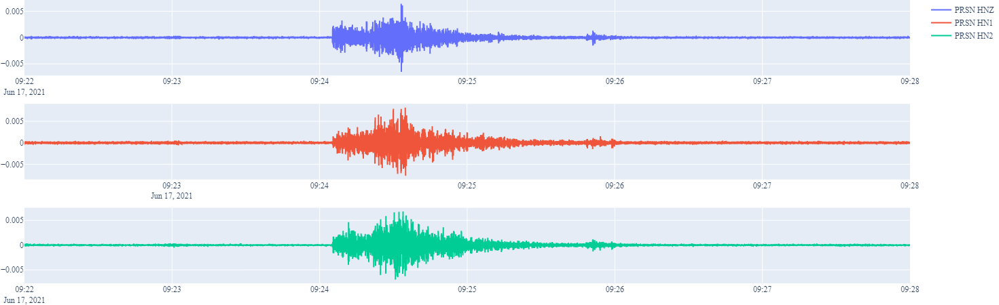

In [84]:
plotWaves(df_w)

## Step 4: Estimate ray parameter p 

### a. Epicentral Distance
From single solution files obtain the epicentral distance, if a list of paths is provided the function `get_epicentral_distances` could be used. Otherway could be to computed based on the function `degrees2kilometers`.

In [85]:
ed_dict = get_epicentral_distances(sol_paths, cat.ID[i], header = 'STA NET')
ed_dict[sta]

ID:	20210617092343
path:	C:\Users\Daniel\Documents\PRSN_2023\Events\solution\20210617092343


{'HHZ': 42.6, 'HH1': 42.6}

### b. Crustal Model

In [90]:
# Values from crustal paper:
thickness = [2.8, 5.2, 6, 6, 15, 100] #[5.5, 10.5, 16.0, 100.0] (km)
Vps = list(np.array([4.5,5.5,6.5,7.1,7.9,8]) * 1000) #list(np.array([5.5, 6.3, 6.7, 7.8]) * 1000) (km/s * 1000m/km) vs = vp/1.75

# Event location:
event_lat = cat.Latitude[i]
event_lon = cat.Longitude[i]

# Station location:
sta_lat = df_w.lat[0]
sta_lon = df_w.lon[0]

# Focal depth (km):
D = cat_m4.Depth[i]

# Epicentral distance (km):
R = 42.6 # degrees2kilometers(locations2degrees(event_lat, event_lon, sta_lat, sta_lon))

p, _, _, _ = solve_p(D, R, thickness, Vps)
p

5.796641776895985e-05

## Step 6: Obtain Ur/Uz

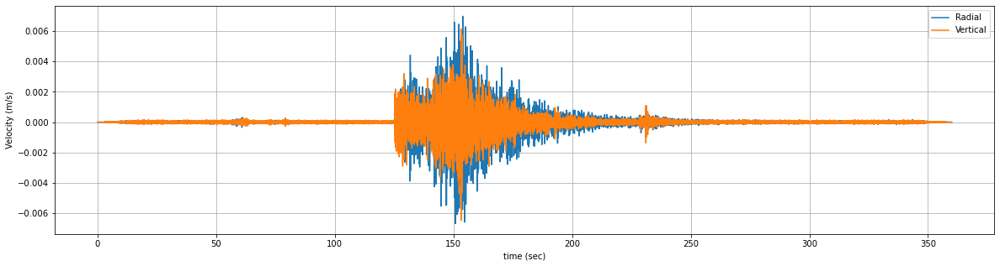

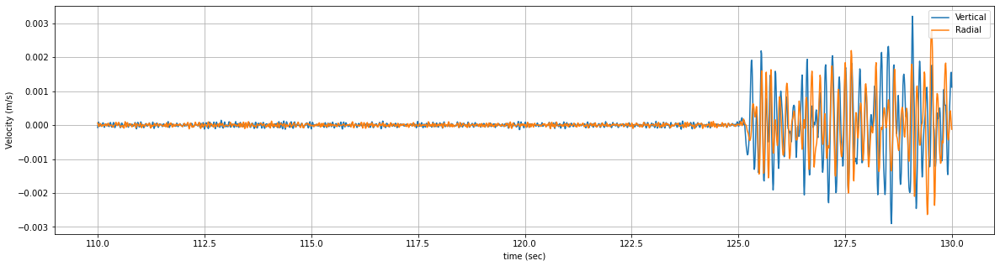

Please input the time of P-wave arrival (about 0.5 sec precision): 125


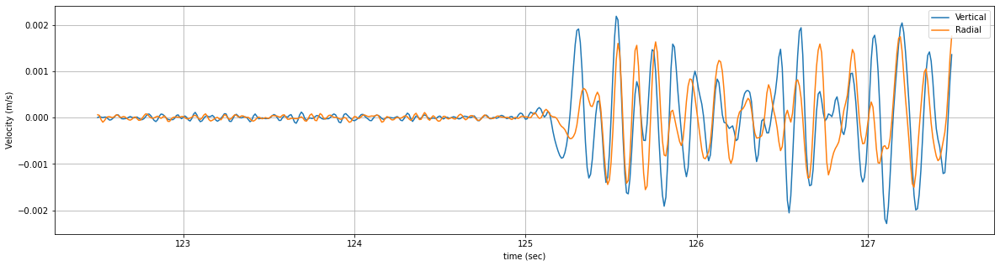

Please input the time begin from when you want to find peaks: 125.1
Please input the amplitude threshold to initiate the peak search: .0007


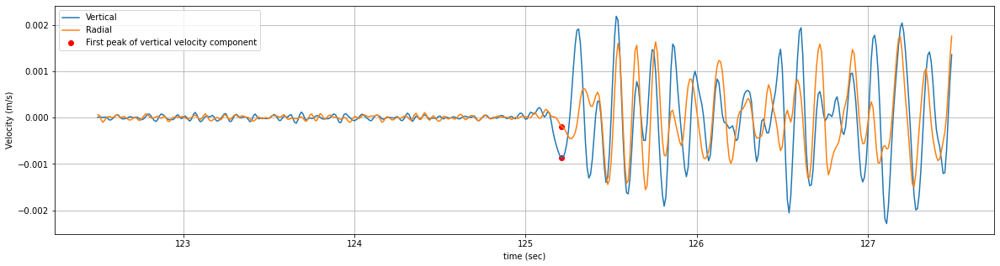

Does the pick look okay (y or n)?  y


In [88]:
# Input information: azimuth angle of horizontal channels, locations of station and event
t, dt, ur, uz, Epidist, SNRpass, start = process_records2(df_w, event_lat, event_lon, datatype = 'vel')
ratio, arri, index_start, index_end = comp_ratio(t, ur, uz, 1/dt, start=120)

## Step 7: Compute Vsz

In [91]:
Vsz, _ = solve_Vsz(ratio, p)
Vsz

1831.1700442760668

## Step 8: Vsz to Vs30 conversion
In this step, the user can use a user-defined Vsz to Vs30 correlation to convert the estimated Vsz to Vs30. Appropriate Vsz to Vs30 correlation should be selected or developed based on the region of interest.